# Faster and Better Machine Learning

# Abstract (text)
$\beta$-Vae  Compared with 

## Special Codes for Collaboratory (code)
### Provides access to google drive
This code provides access to your google drive folder so files  can be saved

In [1]:
# if running on collaboratory set = True
collaboratory = False

if collaboratory:
    from google.colab import drive
    drive.mount('/content/drive')
else: 
    print('Running on local systems, if running on collaboratory please change above')

Running on local systems, if running on collaboratory please change above


In [2]:
if collaboratory:
    cd drive/My\ Drive

SyntaxError: invalid syntax (<ipython-input-2-e1e943f632a1>, line 2)

In [ ]:
if collaboratory:
    cd ..

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
#
import tensorflow 
#import keras.backend.tensorflow_backend as KTF
gpu_devices = tensorflow.config.experimental.list_physical_devices('GPU')

for device in gpu_devices:
    tensorflow.config.experimental.set_memory_growth(device,True)
    
gpus = tensorflow.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tensorflow.config.experimental.set_visible_devices(gpus[1], 'GPU')
    logical_gpus = tensorflow.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

2 Physical GPUs, 1 Logical GPU


## Download Git Repository

In [3]:
import os

if os.path.exists("./Faster-than-Faster-Better-than-Better-Machine-Learning-Electromechanical-Switching-in-Ferroelec"):
    pass
else:
    # ferroelectric
    !git clone https://github.com/shuyuqin/Faster-than-Faster-Better-than-Better-Machine-Learning-Electromechanical-Switching-in-Ferroelec.git

In [2]:
cd "Faster-than-Faster-Better-than-Better-Machine-Learning-Electromechanical-Switching-in-Ferroelec"

/home/shuyu/497_MAT_Assignment/Faster-than-Faster-Better-than-Better-Machine-Learning-Electromechanical-Switching-in-Ferroelec


In [41]:
!git pull

Updating 33b0154..85fd9b6
Fast-forward
 ...ly0.0175_epochs_begin_6000+7000+0977-0.01623.hdf5 | Bin 0 -> 20229664 bytes
 ...ly0.2000_epochs_begin_2000+4000+0057-0.09427.hdf5 | Bin 0 -> 20250376 bytes
 2 files changed, 0 insertions(+), 0 deletions(-)
 create mode 100644 faster_code/phase_shift_only0.0175_epochs_begin_6000+7000+0977-0.01623.hdf5
 create mode 100644 faster_code/phase_shift_only0.2000_epochs_begin_2000+4000+0057-0.09427.hdf5


In [42]:
cd faster_code

/home/shuyu/497_MAT_Assignment/Faster-than-Faster-Better-than-Better-Machine-Learning-Electromechanical-Switching-in-Ferroelec/faster_code


## Implement and load the package

In [7]:
#TODO: Look to see if there is a nicer way to update packages to specific dependencies. ?? Requirement File.
# TODO: This can be put into the requirement document.


# Make sure needed packages are installed and up-to-date
import sys
# Installs base packages
!conda install --yes --prefix {sys.prefix} numpy scipy scikit-learn Ipython ipywidgets h5py

# Installs BGLib and PyUSID
!{sys.executable} -m pip install -U BGlib

/bin/bash: conda: command not found
Requirement already up-to-date: BGlib in /usr/local/lib/python3.7/dist-packages (0.0.2)


## Implement the particular version of package

In [8]:
# implements the packages with particular versions (If do not want to change the currrent version,
# can set up a new environment)
!pip install  -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/tensorflow/docs (to revision 54c4be729f0550869d07c31cd79a65bcdac2cff2) to /tmp/pip-install-52_8ju9_/tensorflow-docs_9f6ede13248e4bf28651d8e4d363f87b
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-install-52_8ju9_/tensorflow-docs_9f6ede13248e4bf28651d8e4d363f87b
  Running command git rev-parse -q --verify 'sha^54c4be729f0550869d07c31cd79a65bcdac2cff2'
  Running command git fetch -q https://github.com/tensorflow/docs 54c4be729f0550869d07c31cd79a65bcdac2cff2
  Running command git checkout -q 54c4be729f0550869d07c31cd79a65bcdac2cff2


In [ ]:
import sys
!{sys.executable} -m pip install openpyxl

# Import External Package from the codes file

In [5]:
%load_ext autoreload
%autoreload 2

import codes.util.core as core
import codes.util.file as file
import codes.util.machine_learning as ml
import codes.util.dictionary_learning as dl
import tensorflow as tf
from tensorflow.random import set_seed
import numpy as np
from skimage import io
from IPython.core.display import Video
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import DictionaryLearning #PCA, NMF,
from scipy import io as ios
import pandas as pd
import seaborn as sns

## Formating

In [44]:
# Sets the print formatting
printing = {'PNG':True,
            'EPS':False, 
           'dpi': 300}

# Example on Generated Data
## Global Parameters (code)

In [45]:
save_path = './'        #Where to save figures
global_n = 5           # Number of components in dictionary learning analysis
add_in_save = ''       # Add into the figure save name
global_alp = [1,6,12]  # Alpha values to try

path_to_data = './'

# Automatically generate a folder structure to save results
comp_folder = str(global_n)+'_comp/'
alp_folder = str(global_alp)+'_alp/'

# makes the folder
folder_name = file.make_folder(save_path+comp_folder+alp_folder)

## Generates Random Image and Spectra (Code)

In [46]:
# Sets random seed for reproducibility
seed = 2
np.random.seed(seed)

# generates random parameters for spectra
random_values = np.random.uniform(size=(10000,3))

# Generates spectra from random RGB values
random_data = core.generate_data(random_values)

## Generates Validation Data from Painting (Code)

In [43]:
# Loads dog image
image = io.imread('./nala.jpg')

# Crops dog image
image = image[200:1900:8, 100:1500:8]/255 #8 sets the downsampling

# Generates spectra from image of dog
dog_data = core.generate_data(image.reshape(-1,3))

## Visualize Generated Images (Code)

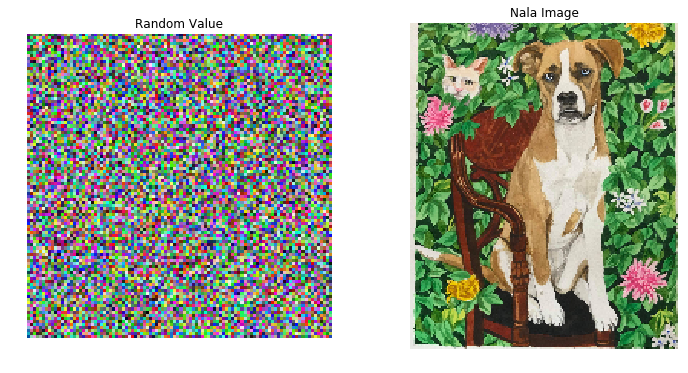

In [47]:
fig, ax = core.layout_fig(2, mod=2,x=2,y=2)
size = int(np.sqrt(random_values.shape[0]))

ax[0].imshow(random_values.reshape(size,size,3))
ax[0].set_axis_off()
ax[0].title.set_text('Random Value')
ax[1].imshow(image)
ax[1].set_axis_off()
ax[1].title.set_text('Nala Image')

## TODO: Show example of randomly generated spectra

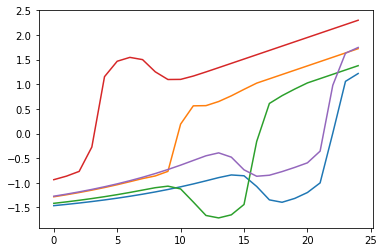

In [38]:
plt.plot(dog_data[0])
plt.plot(dog_data[10])
plt.plot(dog_data[100])
plt.plot(dog_data[1000])
plt.plot(dog_data[10000])

## Preprocessing (Code)
### Normalization

In [48]:
%%time
#TODO: Add documentation to this

scaler = core.global_scaler()

scaled_data = scaler.fit_transform(random_data)

scaled_dog = scaler.transform(dog_data)

CPU times: user 5.05 ms, sys: 282 µs, total: 5.33 ms
Wall time: 4.83 ms


## Dictionary Learning Pipeline

### **Step 1:** Run a kmeans analysis (code)

In [49]:
%%time
#from the paper: Better, Faster, and Less Biased Machine Learning: Electromechanical Switching in Ferroelectric Thin Films. 
#doi: https://doi.org/10.1002/adma.202002425
#doi: 10.5281/zenodo.4030725 - Subject to original BSD-2 License.

# This is the number of true clusteres
nclusters = 3

# Fixes the seed
np.random.seed(seed)

# computes kmeans
kmeans = KMeans(n_clusters=nclusters, 
                random_state=0).fit(scaled_data)

CPU times: user 20.5 s, sys: 7.11 s, total: 27.6 s
Wall time: 1.23 s


### Step 2: Use clusters as initial guess for dictionary learning (code)

In [50]:
#from the paper: Better, Faster, and Less Biased Machine Learning: Electromechanical Switching in Ferroelectric Thin Films. 
#doi: https://doi.org/10.1002/adma.202002425
#doi: 10.5281/zenodo.4030725 - Subject to original BSD-2 License.

# extracts the labels
clusters_2nd = kmeans.labels_

# extracts the clusters 
centroids_2nd = kmeans.cluster_centers_

#### Reformat the kmeans results to use as the initial guess for Dictionary learning
labels = clusters_2nd
comp_init = np.zeros_like(centroids_2nd)
lm_init = np.zeros((len(labels),nclusters))

for i in range(nclusters):
    u = np.zeros_like(labels)
    u[labels==i] = 1
    lm_init[:,i] = u
    comp_init[i] = centroids_2nd[i]

### Step 3: Fit the dictionary learning model (code)

In [51]:
%%time

#from the paper: Better, Faster, and Less Biased Machine Learning: Electromechanical Switching in Ferroelectric Thin Films. 
#doi: https://doi.org/10.1002/adma.202002425
#doi: 10.5281/zenodo.4030725 - Subject to original BSD-2 License.

# Fixes the seed
np.random.seed(seed)

# instantiates the dictionary learning model
dictonary_model = DictionaryLearning(n_components=3,
                                     code_init=lm_init,
                                     dict_init = comp_init, 
                                     n_jobs=1, 
                                     max_iter=1000, 
                                     transform_algorithm='lasso_lars', 
                                     alpha=1, 
                                     fit_algorithm='cd',
                                     positive_code=True, 
                                     tol=1e-9)


# Fits the dictionary learning model
_ = dictonary_model.fit(scaled_data)

CPU times: user 38.5 s, sys: 40.3 s, total: 1min 18s
Wall time: 12.3 s


### Step 4: Generate the prediction of the dictionary learning model (code)

In [52]:
%%time
#from the paper: Better, Faster, and Less Biased Machine Learning: Electromechanical Switching in Ferroelectric Thin Films. 
#doi: https://doi.org/10.1002/adma.202002425
#doi: 10.5281/zenodo.4030725 - Subject to original BSD-2 License.

# Prediction on random data
dictionary_prediction = dictonary_model.transform(scaled_data)

# validation on dog data
dictionary_dog_prediction = dictonary_model.transform(scaled_dog)

CPU times: user 8.25 s, sys: 2.09 s, total: 10.3 s
Wall time: 6.86 s


### Step 5: Computes the reconstruction of the spectra from the dictionary model (code)

In [53]:
return_data_random = np.dot(dictionary_prediction, dictonary_model.components_)
return_data_dog = np.dot(dictionary_dog_prediction, dictonary_model.components_)

###  Step 6: Visualize the Generated Results and the Embedding map 



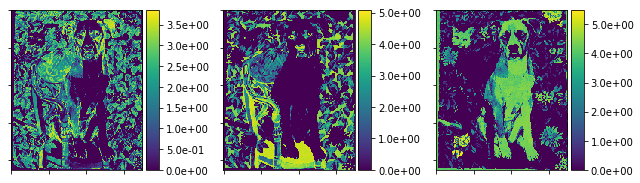

In [54]:
figure1 = core.embedding_maps(dictionary_dog_prediction, image)

In [24]:
# Create the spectrum generator and generate the moive.

folder = 'generator_/dl_dog'
movie_name = 'dictionary_learning_generator_movie'

generator_dictionary_maker = core.generator(dictonary_model,scaled_dog,image)
generator_dictionary_maker.generator_images(folder = folder, 
                                 number_of_loops=20)

file.make_movie(movie_name,
                folder,
                folder,
                'png',
                2, 
               output_format='mp4')

t:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

Moviepy - Building video generator_/dl_dog/dictionary_learning_generator_movie.mp4.
Moviepy - Writing video generator_/dl_dog/dictionary_learning_generator_movie.mp4



Moviepy - Done !
Moviepy - video ready generator_/dl_dog/dictionary_learning_generator_movie.mp4


In [30]:
# Play the vedio of the generator
Video(folder+movie_name+".mp4", embed=True)

## Long-Short Term Memory beta Variational Autoencoder Pipline (code)

### Step 1: Builds the model (code)

In [55]:
#TODO train again with fixed seed and current data.
beta = 0
model_dnn = ml.model_builder(np.atleast_3d(scaled_data),embedding=16, 
              VAE=True, l1_norm_embedding=1e-3,coef=beta)

optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)

model_dnn.vae.compile(optimizer, loss=tf.keras.losses.MeanSquaredError())

### Step 2: Load the pretrained weights or retrain the model (code)

In [56]:
# Fix the seed and load the weights
retrain = False
core.set_seeds()

if retrain: 


    ml.Train(12000,
             2000,
             100,
             0,
             0.005,
             scaled_data,
             'scaled_data',
             ith_epoch=None,
             file_path=None,
             batch_size=300)
else: 
    # Load pretrained weights
    model_dnn.vae.load_weights('./phase_shift_only0.2000_epochs_begin_2000+4000+0057-0.09427.hdf5')

## generate the embedding map

In [57]:
%%time
embedding = model_dnn.encoder_model.predict(np.atleast_3d(scaled_dog))

CPU times: user 33.5 s, sys: 3.68 s, total: 37.1 s
Wall time: 24.9 s


In [14]:
image.shape

(213, 175, 3)

## Generate the movie of the embedding changes with the weights 

In [20]:
# generate the PNG figures into particular folders
load_folder=core.make_folder('./scaled_data/movie_1')
for i in range(0,1):
    j=i*0.005
    beta = format(j,'.4f')
    
    extract_folder = './scaled_data/beta='+beta+'_beta_step_size=0.005_16_layer_size_128_l1_norm_0_l1_norm_1e-05_VAE_True_'
    if i <10:
        file_name = '00'+str(i)+ '_beta='+beta
        
    elif i<100:
        file_name = '0'+str(i)+ '_beta='+beta
    else:
        
        file_name = str(i)+'_beta='+beta
        
    core.training_images(model_dnn.vae,
                    np.atleast_3d(scaled_dog),
                    image,
                    30,
                    extract_folder,
                    beta,
                    printing,
                    load_folder,
                    file_name)

In [26]:
# Reduce the png size and run the movie generator
dog_embedding_name = 'dog_embedding_movie'
file.make_movie(dog_embedding_name,
                load_folder,
                'scaled_data',
                'png',
                5, 
               output_format='mp4')

t:   0%|          | 0/2165 [00:00<?, ?it/s, now=None]

Moviepy - Building video scaled_data/dog_embedding_movie.mp4.
Moviepy - Writing video scaled_data/dog_embedding_movie.mp4



Moviepy - Done !
Moviepy - video ready scaled_data/dog_embedding_movie.mp4


In [27]:
Video("scaled_data/dog_embedding_movie.mp4", embed=True)

In [28]:
#Show the movie how the embedding changes and select the 3 channel activated.
figure2 = core.embedding_maps(embedding, image,mod=4)

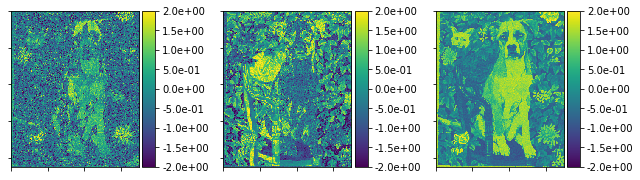

In [58]:
figure2 = core.embedding_maps(embedding[:,[6,7,11]], image, c_lim=[-2,2])

## generate the prediction of the nn model

In [59]:
%%time
random_nn_out = model_dnn.vae.predict(np.atleast_3d(scaled_data)) 

CPU times: user 21.2 s, sys: 1.9 s, total: 23.1 s
Wall time: 17 s


## generate movie of the embedding result

In [41]:
generator_dictionary_maker = core.generator(model_dnn,scaled_dog,image,channels=[6,7,11])
generator_dictionary_maker.generator_images(folder = './dog_gen_test/', 
                                 number_of_loops=200)

100%|██████████| 200/200 [04:34<00:00,  1.37s/it]


In [42]:
file.make_movie('dog_gen_movie',
          './dog_gen_test/',
          './dog_gen_test/',
          'png',
          5)

Moviepy - Building video ./dog_gen_test//dog_gen_movie.mp4.
Moviepy - Writing video ./dog_gen_test//dog_gen_movie.mp4



Moviepy - Done !
Moviepy - video ready ./dog_gen_test//dog_gen_movie.mp4


In [43]:
Video('./dog_gen_test/'+'dog_gen_movie'+".mp4", embed=True)

## Compare the results of two models

In [60]:
x = np.linspace(-1,1,25)

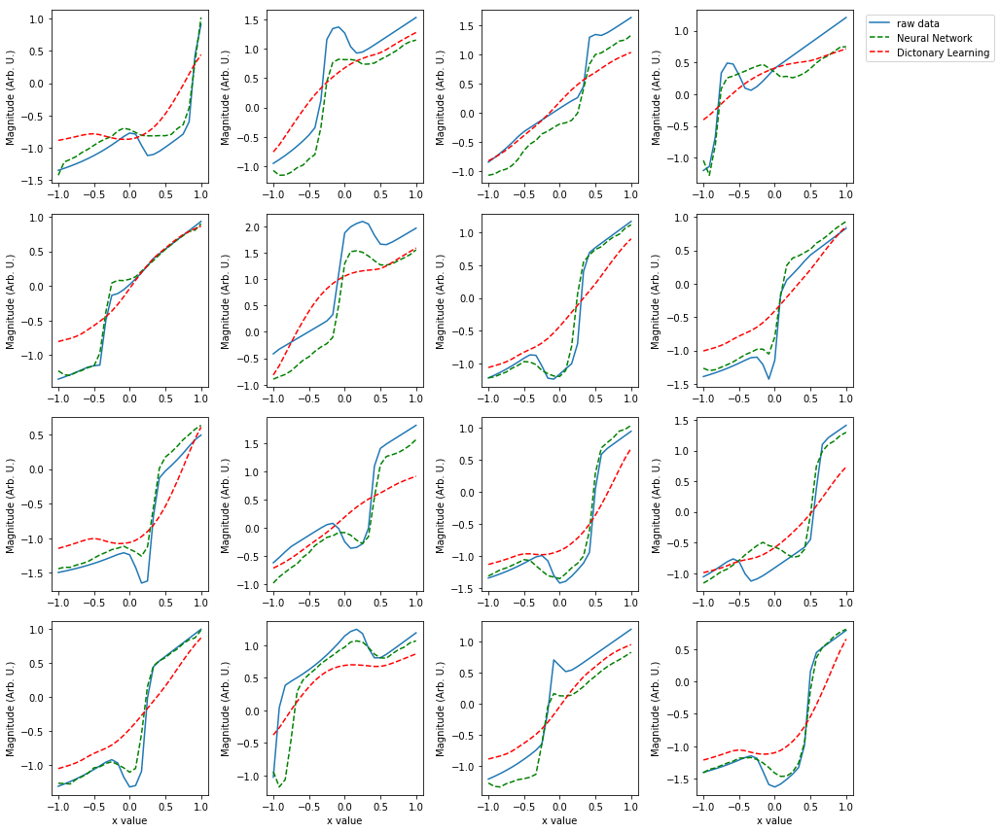

In [61]:
fig, ax = core.layout_fig(16, mod=4, x=1.2)

ind = np.random.randint(0,scaled_data.shape[0],size=16)

ax=ax.ravel()

for i, ax in enumerate(ax):
    ax.plot(x, scaled_data[ind[i]], label='raw data')
    ax.plot(x, random_nn_out[ind[i]].squeeze(),'g--', label = 'Neural Network')
    ax.plot(x, return_data_random[ind[i]]
            ,'r--', label = 'Dictonary Learning')
    #ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
    ax.set_ylabel('Magnitude (Arb. U.)')

    if i > 11:
      ax.set_xlabel('x value')
    
    if i == 3:
        ax.legend(bbox_to_anchor =(1.05, 1))
        
plt.tight_layout()

In [213]:
dl_error = (scaled_data-return_data_random)

In [215]:
nn_error = (scaled_data-random_nn_out.squeeze())

In [234]:
d_test = {'value':dl_error[:,0],'spectrum':np.zeros(10000),'type':np.zeros(10000)}
d_test1 = {'value':dl_error[:,1],'spectrum':1+np.zeros(10000),'type':np.zeros(10000)}
df = pd.DataFrame(d_test)
df1 = pd.DataFrame(d_test1)

In [236]:
new_df = pd.concat([df,df1])

In [238]:
for i in range(2,25):
    d_test = {'value':dl_error[:,i],'spectrum':i+np.zeros(10000),'type':np.zeros(10000)}
    df = pd.DataFrame(d_test)
    new_df = pd.concat([new_df,df])

In [242]:
for i in range(25):
    d_test = {'value':nn_error[:,i],'spectrum':i+np.zeros(10000),'type':1+np.zeros(10000)}
    df = pd.DataFrame(d_test)
    new_df = pd.concat([new_df,df])

In [254]:
new_df['type'].replace({0.0:"DL",1.0:"NN"},inplace=True)

In [255]:
new_df

,spectrum,type,value
0,0.0,DL,0.332586
1,0.0,DL,-0.218346
2,0.0,DL,-0.771647
3,0.0,DL,-0.675858
4,0.0,DL,-0.789751
5,0.0,DL,-0.195585
6,0.0,DL,-0.158615
7,0.0,DL,-0.785446
8,0.0,DL,-0.908907
9,0.0,DL,-0.280412


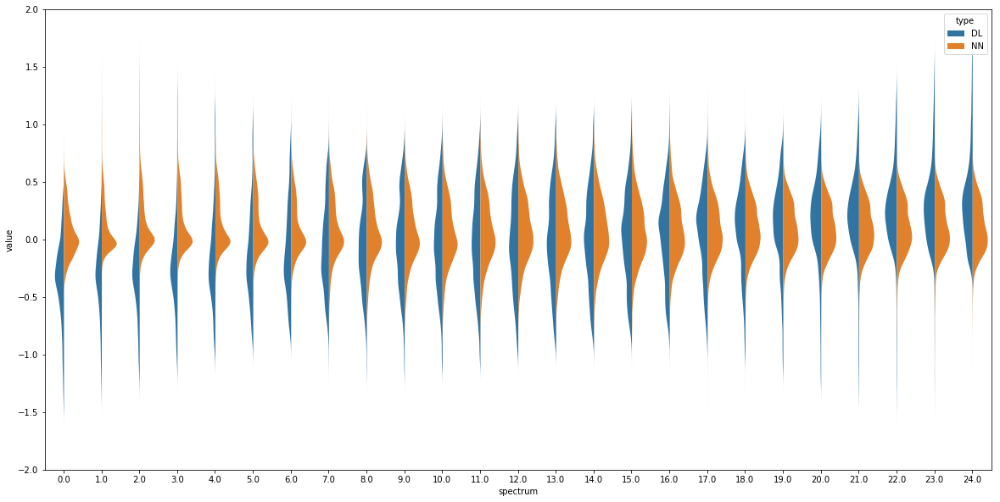

In [264]:
#fig,ax = plt.subplots(1,2,figsize=(20,10))
plt.figure(figsize=(20,10))
plt.ylim([-2,2])
sns.violinplot(data=new_df,x='spectrum',y='value',hue='type',split=True, linewidth=0)


(-2, 2)

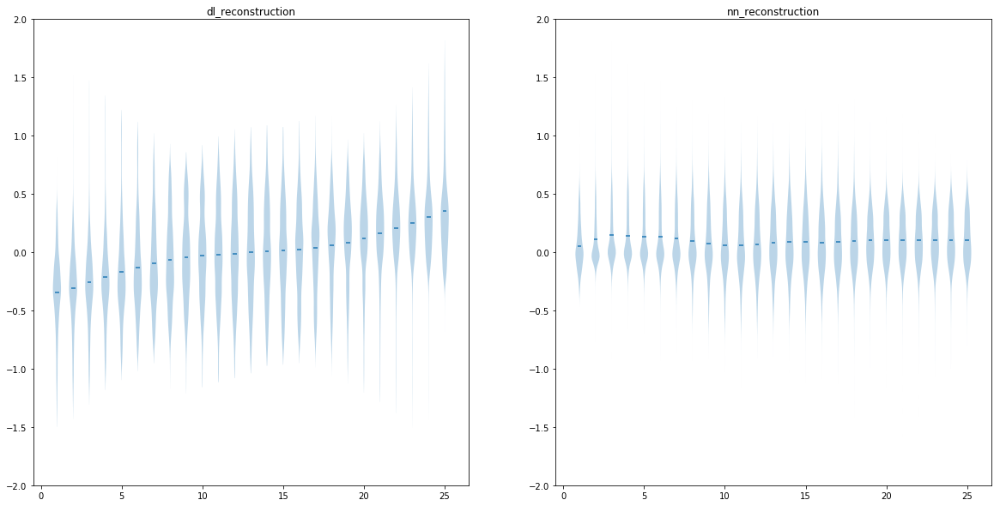

In [250]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
ax[0].violinplot(np.transpose(dl_error,(0,1)),showmeans=True, showmedians=False,
        showextrema=False)
ax[0].set_title('dl_reconstruction')
ax[0].set_ylim([-2,2])
ax[1].violinplot(np.transpose(nn_error,(0,1)),showmeans=True, showmedians=False,
        showextrema=False)
ax[1].set_title('nn_reconstruction')
ax[1].set_ylim([-2,2])


In [97]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [98]:
mean_squared_error(scaled_data,return_data_random)

0.18788363127073202

In [99]:
mean_squared_error(scaled_data,random_nn_out.squeeze())

0.07358778190709978

In [267]:
# imports the raw band excitation data dictionary learning
imported = {'data': ios.matlab.loadmat(path_to_data+'Data.mat'),
            'validation_data': ios.matlab.loadmat(path_to_data+'loop_1.mat')}

# extracts the important information from the raw data
raw = {'voltage': imported['data']['Voltagedata_mixed'],
       'piezoresponse': imported['data']['Loopdata_mixed'],
       'amplitude': imported['data']['OutA2_mixed'],
       'phase': imported['data']['OutPhi2_mixed'],
       'resonance': imported['data']['Outw2_mixed'],
       'quality_factor': imported['data']['OutQ2_mixed'],
       'val_piezoresponse': imported['validation_data']['piezo_1'],
       'val_resonance': imported['validation_data']['resonance_loop_1']}

## load the pretrained data

In [8]:
#refer to jagar paper to load the piezo and resonance data in the same format
pie_data = np.load('pizoresponse.npy')
res_data = np.load('resonance.npy')
res_data = np.atleast_3d(res_data)
new_data = np.concatenate((pie_data,res_data),axis=2)
vol = np.load('voltage.npy')

TODO: You need a figure to show how you generate the data

Show random generated spectra and equation

# Dictionary Learning for combination of piezoresponse and resonance data 
The dictionary learning is based on the result of the paper: Better, Faster, and Less Biased Machine Learning:
Electromechanical Switching in Ferroelectric Thin Films.The ORCID identification number(s) for the author(s) of this article
can be found under https://doi.org/10.1002/adma.202002425.


## import and clean the data

In [268]:
# These cleaning steps were also performed in [1,2]
dl.range_filter(raw['resonance'], [1300, 1340])          # "Hard limit" replace resonance values outside the specified range with NaN     
dl.range_filter(raw['val_resonance'], [1300, 1340])      # Same for the first cycle resonance
dl.clean_interpolate(raw['resonance'],'linear').reshape(-1, raw['resonance'].shape[2])    #Interpolate those NaNs

array([[1316.56298484, 1316.85098085, 1316.4753691 , ..., 1317.9234046 ,
        1318.10937733, 1318.03857044],
       [1319.31182758, 1319.11098001, 1319.36025077, ..., 1320.27286958,
        1320.16729895, 1320.17534472],
       [1319.29792087, 1319.05178431, 1319.07999963, ..., 1319.37266502,
        1319.58981849, 1319.87632619],
       ...,
       [1327.44357597, 1327.31951814, 1327.33201154, ..., 1327.70510708,
        1327.78603897, 1327.80754424],
       [1327.17790234, 1327.34066654, 1327.21556803, ..., 1327.87324892,
        1327.72284503, 1327.75400904],
       [1326.7496446 , 1326.96006052, 1326.98423162, ..., 1327.18681378,
        1327.33968267, 1327.23022542]])

## Extract and Format

In [269]:
# extract the second cycle data (amplitude, phase, resonance, and Q)
second_amp = np.reshape(raw['amplitude'],(3600,96))
second_ph = np.reshape(raw['phase'],(3600,96))
second_res = np.reshape(raw['resonance'],(3600,96))
second_q = np.reshape(raw['quality_factor'],(3600,96))

# Extract the provided "optimal rotation angle"
opt_ang = np.reshape(imported['data']['optrotang_mixed'],(3600))

# Resonstrcut the second cycle PR
second_ph = second_ph+np.mean(opt_ang)
second_pr = second_amp*np.cos(np.deg2rad(second_ph))

#Extract voltage data
v_cycle = imported['data']['VoltageDC_mixed'][:,0].squeeze()



/usr/lib/python3/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in cos
  if sys.path[0] == '':


In [270]:
# Replace any infinte values in the amplitude/phase curves with NaN. NaNs can be ignored when taking the mean, infs can't.
second_amp[~np.isfinite(second_amp)] = np.nan
second_ph[~np.isfinite(second_ph)] = np.nan

# Get the mean maps for plotting later
sA_mean = np.nanmean(second_amp, axis=1)
sP_mean = np.nanmean(second_ph, axis=1)
sR_mean = np.nanmean(second_res, axis=1)
sQ_mean = np.nanmean(second_q, axis=1)
sPR_mean = np.nanmean(second_pr, axis=1)



In [271]:
all_second = np.hstack([second_pr,second_res])       #Here we are interested in the piezoresponse and the resonance
num_vars = 2     # Thats two variables

#We have to account for infinite values (bad fits) in the piezoresponse
x, y = np.where(~np.isfinite(all_second))
all_second[x, y] = 0

#-------------Generate all of the various labels to use in the data frame
times = 96
all_vals = np.repeat('PR', times)
for var in ['Res']:
    varlist = np.repeat(var, times)
    all_vals = np.hstack([all_vals,varlist])

xvals = np.hstack([v_cycle,v_cycle])
chirps = np.tile(np.arange(times),num_vars)
inout = np.tile(np.full(times, 0),num_vars)
plotgroup = np.tile(np.full(times, 0),num_vars)
arrays =[all_vals,chirps,inout,plotgroup,xvals]

cols = pd.MultiIndex.from_tuples(list(zip(*arrays)), names=['Vars', 'ChirpNum','InOut','PlotGroup','xaxis'])
index = pd.Index(np.arange(3600).astype(int),name='Acq')
#---------------

# Create the dataframe
second_data = pd.DataFrame(all_second, columns=cols, index=index)

## Use Kmeans to highlight outliers

In [272]:
res_mean = np.mean(second_data['Res'],axis=1)
pie_mean = np.mean(second_data['PR'],axis=1)

### Remove Mean and Scale PR

In [273]:
scale = 3 # Constant to scale PR by such that resonance and PR have the same standard deviation

# For each row of data (i.e. spatial point), remove the mean of the row
second_data['Res'] = second_data['Res'].apply(lambda x: x-x.mean(), axis=1)
second_data['PR'] = second_data['PR'].apply(lambda x: x-x.mean(), axis=1)

#Scale piezoresponse
second_data['PR'] = second_data['PR']*scale*1e4

In [274]:
# Run kmeans
var = ['Res']         # Variable to run
data = second_data    # Data to run
voltages = v_cycle    # x-axis data, i.e. voltages

orig_shape = [60,60]
nclusters = 8
voltages = data[var].columns.get_level_values('xaxis')

kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(data[var])
clus_mean_removal = kmeans.labels_.reshape((orig_shape[0], orig_shape[1]))
cent_mean_removal = kmeans.cluster_centers_

### Run a final kmeans analysis

In [275]:
vol = np.load('voltage.npy')

In [276]:
stack_vars = ['PR','Res']
data_list = ['PR','Res']
data = all_second
voltages = v_cycle

orig_shape = [60,60]
nclusters = global_n

stacked_dataset = second_data

#kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(stacked_dataset.values[~flags,:])
kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(stacked_dataset.values)
clusters_2nd = kmeans.labels_
centroids_2nd = kmeans.cluster_centers_

## Run Dictionary Learning

In [277]:
%%time
# Lists to save all of the components/maps
comps = []
maps = []

voltages = v_cycle              #Voltage values
stacked_dataset = second_data  #The data to analyze

# For each alpah value listed above
for alp in global_alp:

    orig_shape = [60,60]       # Don't forget this is a 60,x60 grid
    sparsity = alp             # Alpha value for this iteration
    iterations = 10000         # Max number of iterations
    num_components = global_n  # Number of components to find

#    dataset_analysis = stacked_dataset.values[~flags,:]    # Remove the above "bad" points from consideration
    dataset_analysis = stacked_dataset.values
    #### Reformat the kmeans results to use as the initial guess for Dictionary learning
    labels = clusters_2nd
    comp_init = np.zeros_like(centroids_2nd)
    lm_init = np.zeros((len(labels),num_components))
    for i in range(num_components):
        u = np.zeros_like(labels)
        u[labels==i] = 1
        lm_init[:,i] = u
        comp_init[i] = centroids_2nd[i]
        
    # Set up dictionary learning model
    model = DictionaryLearning(n_components=num_components, code_init=lm_init, dict_init = comp_init, n_jobs=-1, max_iter=iterations, transform_algorithm='lasso_lars', alpha=sparsity, fit_algorithm='cd',positive_code=True, tol=1e-9)
    
    # Fit and get weight maps/ components
    DL_loading_maps = model.fit_transform(dataset_analysis)
    DL_components = model.components_

CPU times: user 20min 21s, sys: 45min 32s, total: 1h 5min 54s
Wall time: 32min 21s


## Visualize the fit and transform of the model 

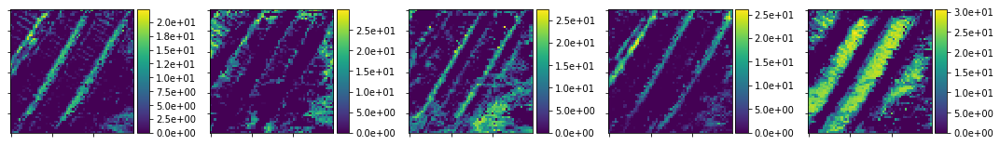

In [41]:
figure3=core.embedding_maps(DL_loading_maps, np.zeros((60,60)), mod = 5)

In [ ]:
# modeify the figure below

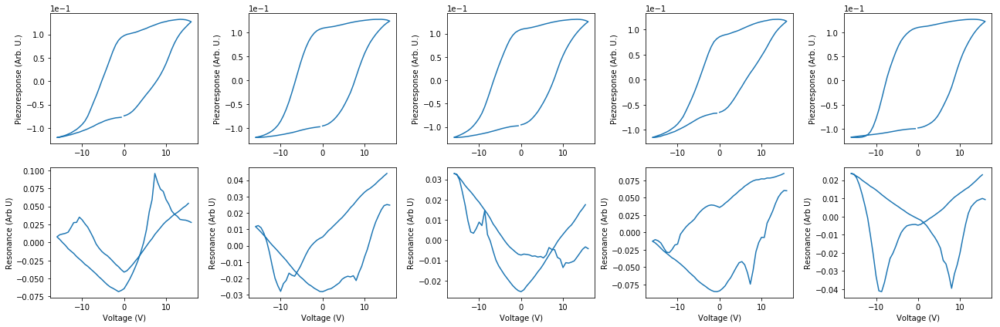

In [42]:
fig, ax = core.layout_fig(10, mod=5, x=1.2)

ax = ax.ravel()

for i, ax in enumerate(ax):
    
    if i < 5:
        ax.plot(voltages,DL_components[i][0:96])
        ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
        ax.set_ylabel('Piezoresponse (Arb. U.)')
        
    else: 
        ax.plot(vol,DL_components[i-5][96::])
        ax.set_ylabel('Resonance (Arb U)')
        ax.set_xlabel('Voltage (V)')
        #ax.set_ylim([1324.5,1325.5])
        
plt.tight_layout()

In [ ]:
new_test_ = DL_components[0]
new_test_.shape

(192,)

## Generate the generator of the  dictionary model

In [ ]:
DL_components.shape
dataset_analysis.shape

(3600, 192)

In [ ]:
np.dot( model.components_)

(3600, 5)

In [50]:
Gan = core.generator(model,dataset_analysis,np.zeros((60,60)))
Gan.generator_images('generator_/dl_pr', number_of_loops=20,graph_layout=[5,5], model_tpye='nn',xvalues=vol,y_lim=[-2.5,2.5])


100%|██████████| 20/20 [00:58<00:00,  2.93s/it]


In [51]:
file.make_movie('pr_gen_movie',
          './generator_/dl_pr',
          './generator_/dl_pr',
          'png',
          3)

t:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./generator_/dl_pr/pr_gen_movie.mp4.
Moviepy - Writing video ./generator_/dl_pr/pr_gen_movie.mp4



Moviepy - Done !
Moviepy - video ready ./generator_/dl_pr/pr_gen_movie.mp4


In [52]:
Video('./generator_/dl_pr/'+'pr_gen_movie'+".mp4", embed=True)

## Use the model generate the reconstraction data and unscale the data for comparision

In [278]:
out_dl = np.dot(DL_loading_maps,DL_components)

In [287]:
out_dl_unscale = np.copy(out_dl)
for i in range(out_dl.shape[0]):
    out_dl_unscale[i,0:96] = out_dl_unscale[i,0:96]/(3*1e4)+pie_mean[i]
    out_dl_unscale[i,96:192] = out_dl_unscale[i,96:192]+res_mean[i]

In [288]:
out_dl_unscale.shape

(3600, 192)

# LSTM Neural Network Autoencoder for combination of piezoresponse and resonance data 




## load the pretrained data

In [9]:
pie_data = np.load('pizoresponse.npy')
res_data = np.load('resonance.npy')
res_data = np.atleast_3d(res_data)
new_data = np.concatenate((pie_data,res_data),axis=2)
vol = np.load('voltage.npy')

## Implement the model

## Set the training parameters 

In [14]:
epochs=62000 
epoch_per_increase = 1000

## Train the model

## Load the pretrained weights

In [10]:
nn_model = ml.model_builder_combine(np.atleast_3d(new_data),embedding=16, 
              VAE=True, l1_norm_embedding=1e-9,coef=0)

In [179]:
# Fix the seed and load the weights
retrain = False
core.set_seeds()

if retrain: 


    ml.Train(epochs,
             6000,
             epoch_per_increase,
             0,
             0.0025,
             new_data,
             'pie_res',
             ith_epoch=None,
             file_path=None,
             batch_size=300)
else: 
    # Load pretrained weights
    nn_model.vae.load_weights('phase_shift_only0.0175_epochs_begin_6000+7000+0966-0.01752.hdf5')

In [180]:
combine_image = np.zeros([60,60])

In [17]:
# generate the PNG figures into particular folders
load_folder=core.make_folder('./pie_res_data/movie_')
for i in range(2,62):
    j=i*0.0025
    beta = format(j,'.4f')
    
    extract_folder = '../../two_data_combine_3.10/beta='+beta+'_beta_step_size=0.0025_16_layer_size_128_l1_norm_0_l1_norm_1e-05_VAE_True'
    if i <10:
        file_name = '00'+str(i)+ '_beta='+beta
        
    elif i<100:
        file_name = '0'+str(i)+ '_beta='+beta
    else:
        
        file_name = str(i)+'_beta='+beta
        
    core.training_images(nn_model.vae,
                    new_data,
                    combine_image,
                    29,
                    extract_folder,
                    beta,
                    printing,
                    load_folder,
                    file_name)

In [12]:
# Reduce the png size and run the movie generator
load_folder=core.make_folder('./pie_res_data/movie_')
pr_embedding_name = 'pr_embedding_movie'
file.make_movie(pr_embedding_name,
                load_folder,
                'pie_res_data',
                'png',
                5, 
               output_format='mp4')

t:   0%|          | 0/2029 [00:00<?, ?it/s, now=None]

Moviepy - Building video pie_res_data/pr_embedding_movie.mp4.
Moviepy - Writing video pie_res_data/pr_embedding_movie.mp4



Moviepy - Done !
Moviepy - video ready pie_res_data/pr_embedding_movie.mp4


In [13]:
Video('pie_res_data/'+'pr_embedding_movie'+".mp4", embed=True)

## Generate the reconstraction data 

In [280]:
weight_in_use = 'phase_shift_only0.0175_epochs_begin_6000+7000+0977-0.01623.hdf5'

In [281]:
nn_model.vae.load_weights(weight_in_use)

In [385]:
%%time
core.set_seeds()
nn_out = nn_model.vae.predict(np.atleast_3d(new_data))


CPU times: user 19 s, sys: 920 ms, total: 19.9 s
Wall time: 17.5 s


In [384]:
core.set_seeds()
optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
nn_model.vae.compile(optimizer, loss=tf.keras.losses.MeanSquaredError())
nn_model.vae.evaluate(new_data,new_data)

113/113 [==============================] - 13s 118ms/step - loss: 0.0319


0.03189696744084358

In [386]:
print(mean_squared_error(new_data[:,:,0].squeeze(),new_dl[:,0:96].squeeze()))
print(mean_squared_error(new_data[:,:,0].squeeze(),nn_out[:,:,0].squeeze()))

0.0493935289429388
0.009144227724592438


In [372]:
np.mean(nn_out[:,:,1])

0.08384203

In [387]:
print(mean_squared_error(new_data[:,:,1].squeeze(),new_dl[:,96:192]))
print(mean_squared_error(new_data[:,:,1].flatten(),nn_out[:,:,1].flatten()))

0.03647439365915434
0.054649679260540214


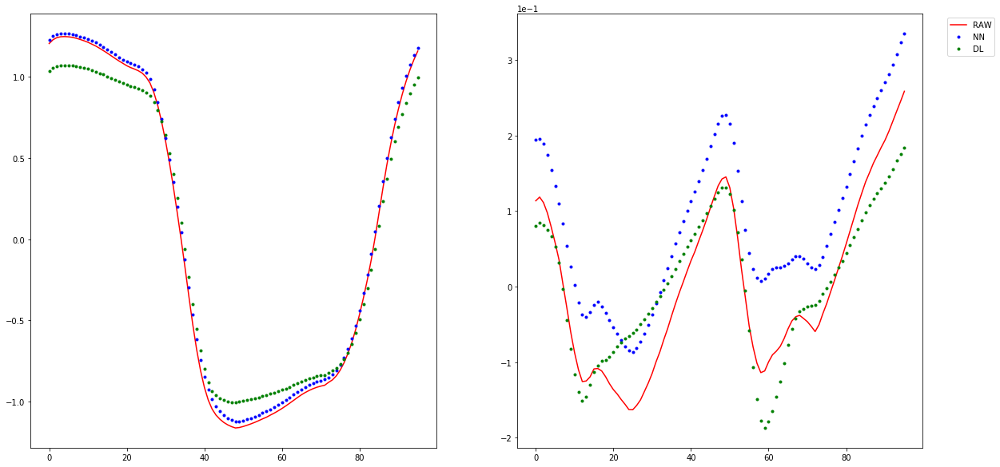

In [403]:
fig,ax=plt.subplots(1,2,figsize=(20,10))
ax[0].plot(np.mean(new_data[:,:,0],axis=0),'r-',label="RAW")
ax[0].plot(np.mean(nn_out[:,:,0],axis=0),'b.',label='NN')
ax[0].plot(np.mean(new_dl[:,0:96],axis=0),'g.',label="DL")
ax[1].plot(np.mean(new_data[:,:,1],axis=0),'r-',label='RAW')
ax[1].plot(np.mean(nn_out[:,:,1],axis=0),'b.',label='NN')
ax[1].plot(np.mean(new_dl[:,96:192],axis=0),'g.',label='DL')
ax[1].ticklabel_format(axis='y',style='sci',scilimits=(0,0))
ax[1].legend(bbox_to_anchor =(1.05, 1))

## Unscale the data for comparision

In [331]:
new_dl = np.dot(DL_loading_maps,DL_components)

In [332]:
unscaled_new_pie = new_dl[:,0:96]*7.859902800847493e-05 -1.0487273116670697e-05
unscaled_new_res = new_dl[:,96:192]*3.1454182388943095+1324.800141637855

In [289]:
unscaled_pie = nn_out[:,:,0]*7.859902800847493e-05 -1.0487273116670697e-05
unscaled_res = nn_out[:,:,1]*3.1454182388943095+1324.800141637855

## plot the embedding channels

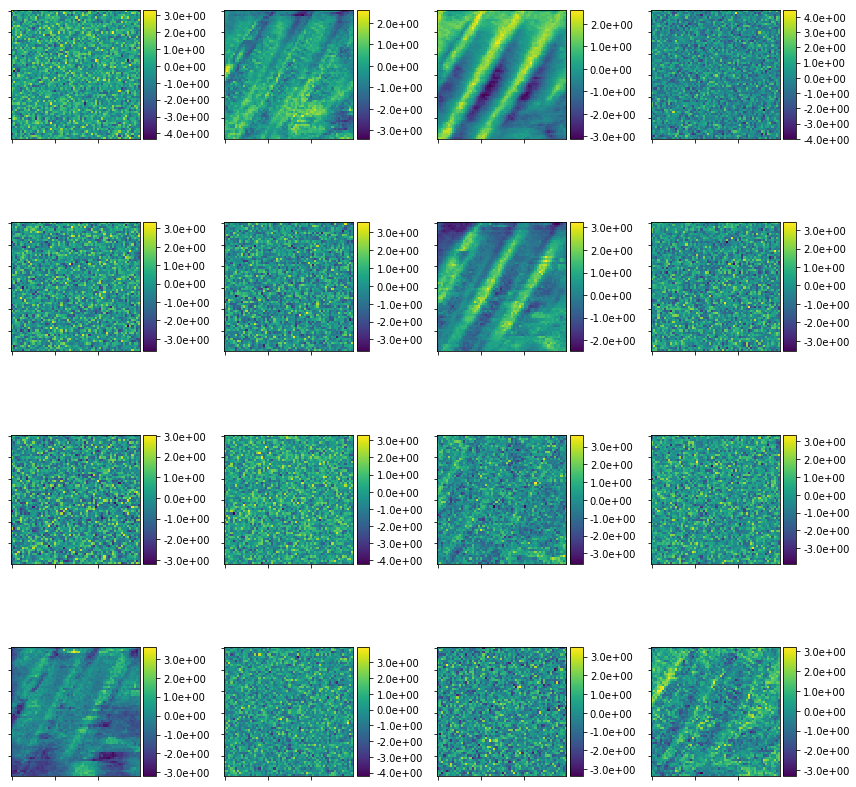

In [185]:
embedding = nn_model.encoder_model.predict(np.atleast_3d(new_data))
image = np.zeros((60,60,3))
figure4 = core.embedding_maps(embedding, image, mod=4)

## Generate the movie

In [186]:
folder = 'generator_/neural_network_pr'
channels = [1,2,6,12,15]

In [20]:
new_data.shape

(3600, 96, 2)

In [210]:
folder = 'generator_/neural_network_pr'

In [211]:
Gan = generator(nn_model,new_data,np.zeros((60,60)),channels=channels)
Gan.generator_images(folder, graph_layout=[5,5],model_tpye='nn',xvalues=vol)

100%|██████████| 200/200 [10:28<00:00,  3.14s/it]


In [24]:
Gan = core.generator(nn_model,new_data,np.zeros((60,60)),channels=channels)
Gan.generator_images(folder, graph_layout=[5,5],model_tpye='nn', y_lim=[-3,2],xvalues=vol)

100%|██████████| 200/200 [10:36<00:00,  3.18s/it]


## Make movie of the generator

In [212]:
nn_pr_movie = 'nn_pr_movie_1'
folder_extract_image = folder
folder_save_movie = 'generator_/'
file.make_movie(nn_pr_movie,folder_extract_image,folder_save_movie,'png',5)

t:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

Moviepy - Building video generator_//nn_pr_movie_1.mp4.
Moviepy - Writing video generator_//nn_pr_movie_1.mp4



Moviepy - Done !
Moviepy - video ready generator_//nn_pr_movie_1.mp4


In [27]:
Video(folder_save_movie+nn_pr_movie+'.mp4',embed=True)

# Compare results of two models

## Load the raw data 

In [290]:
ori_pie = pie_data*7.859902800847493e-05 -1.0487273116670697e-05
ori_res = res_data*3.1454182388943095+1324.800141637855

In [291]:
ori_pie.shape

(3600, 96, 1)

In [293]:
unscaled_pie.shape

(3600, 96)

In [294]:
out_dl_unscale.shape

(3600, 192)

In [333]:
print(mean_squared_error(ori_pie.squeeze(),unscaled_new_pie))
print(mean_squared_error(ori_pie.squeeze(),unscaled_pie.squeeze()))

3.051436989285958e-10
5.6926306989851655e-11


In [336]:
print(mean_squared_error(ori_res.squeeze(),out_dl_unscale[:,96:96]))
print(mean_squared_error(ori_res.squeeze(),unscaled_pie.squeeze()))

0.3608650999361452
0.5467303581037913


In [265]:
pie_data.shape

(3600, 96, 1)


## Plot the raw data, DL result and NN result

In [394]:
nn_error = np.mean((unscaled_res.squeeze()-ori_res.squeeze())**2,axis=1)

In [456]:
np.mean(unscaled_res.squeeze()-np.mean(unscaled_res.squeeze(),axis=1)[:,np.newaxis]

4.810757e-07

In [457]:
nn_error = np.mean(((unscaled_res.squeeze()-np.mean(unscaled_res.squeeze(),axis=1)[:,np.newaxis])-
                    (ori_res.squeeze()-np.mean(ori_res.squeeze(),axis=1)[:,np.newaxis]))**2,axis=1)

In [462]:
dl_error = np.mean(((unscaled_new_res.squeeze()-np.mean(unscaled_res.squeeze(),axis=1)[:,np.newaxis])-
                    (ori_res.squeeze()-np.mean(ori_res.squeeze(),axis=1)[:,np.newaxis]))**2,axis=1)

In [461]:
np.mean(nn_error)

0.09301886439333203

In [463]:
np.mean(dl_error)

0.6637054130960064

In [459]:
np.mean(unscaled_res.squeeze(),axis=1).shape

(3600,)

In [444]:
dl_error = np.mean((unscaled_new_res.squeeze()-ori_res.squeeze())**2,axis=1)

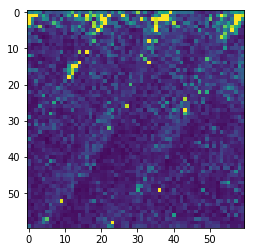

In [460]:
plt.imshow(nn_error.reshape(60,60))
plt.clim(0,0.55)

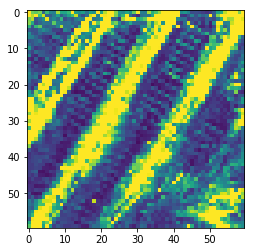

In [447]:
plt.imshow(dl_error.reshape(60,60))
plt.clim(0,0.55)

In [396]:
index_nn = np.argwhere(nn_error>1)

In [415]:
index_r = np.argwhere(nn_error<1)

In [405]:
index_nn.s

(416, 1)

167


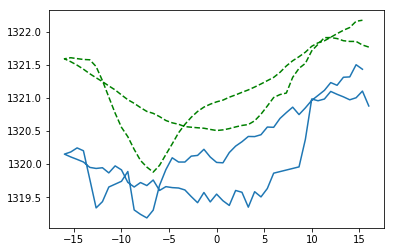

In [441]:
j = np.random.choice(index_nn.squeeze())
plt.plot(vol,ori_res[j])
plt.plot(vol,unscaled_res[j],'g--')
print(j)

3150


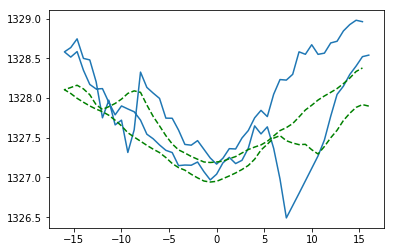

In [432]:
j = np.random.choice(index_r.squeeze())
plt.plot(vol,ori_res[j])
plt.plot(vol,unscaled_res[j],'g--')
print(j)

0.14084897957646703..NN_error
0.15432326022567253..DL_error
........................
0.072757093339682..NN_error
0.7116863367956476..DL_error
........................
0.03584459966146176..NN_error
0.5722846285967441..DL_error
........................
0.06157031711688704..NN_error
0.3189688788156841..DL_error
........................
4.420597907961921..NN_error
0.12559345849050704..DL_error
........................


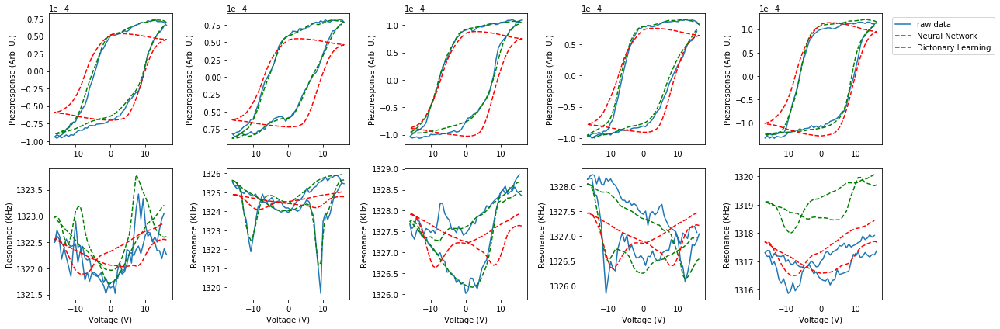

In [391]:
fig, ax = core.layout_fig(10, mod=5, x=1.2)

ind = np.random.randint(0,3600,size=5)

ax=ax.ravel()

for i, ax in enumerate(ax):
    
    if i < 5:
#        ax.plot(voltages, orig_data[ind[i//2], 0:96])
        ax.plot(vol,ori_pie[ind[i]], label='raw data')
        ax.plot(vol,unscaled_pie[ind[i]],'g--', label = 'Neural Network')
        ax.plot(voltages,unscaled_new_pie[ind[i]],'r--', label = 'Dictonary Learning')
        ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
        ax.set_ylabel('Piezoresponse (Arb. U.)')
    else:
#        ax.plot(vol,orig_data[ind[i//2],96:192])
        print(str(mean_squared_error(unscaled_res[ind[i-5]],ori_res[ind[i-5]]))+'..NN_error')
        print(str(mean_squared_error(unscaled_new_res[ind[i-5]],ori_res[ind[i-5]]))+'..DL_error')
        print('........................')
        ax.plot(vol,ori_res[ind[i-5]])
        ax.plot(vol,unscaled_res[ind[i-5]],'g--')
        ax.plot(vol,unscaled_new_res[ind[i-5]],'r--')
        ax.set_ylabel('Resonance (KHz)')
        ax.set_xlabel('Voltage (V)')
    
    if i == 4:
        ax.legend(bbox_to_anchor =(1.05, 1))
        
plt.tight_layout()

file.savefig(f'./example_{ind}_maps', printing)

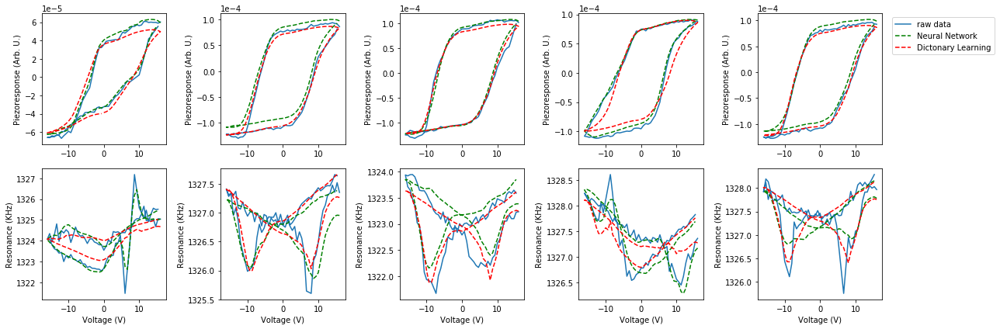

In [309]:
fig, ax = core.layout_fig(10, mod=5, x=1.2)

ind = np.random.randint(0,3600,size=5)

ax=ax.ravel()

for i, ax in enumerate(ax):
    
    if i < 5:
#        ax.plot(voltages, orig_data[ind[i//2], 0:96])
        ax.plot(vol,ori_pie[ind[i]], label='raw data')
        ax.plot(vol,unscaled_pie[ind[i]],'g--', label = 'Neural Network')
        ax.plot(voltages,out_dl_unscale[ind[i],0:96],'r--', label = 'Dictonary Learning')
        ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
        ax.set_ylabel('Piezoresponse (Arb. U.)')
    else:
#        ax.plot(vol,orig_data[ind[i//2],96:192])
        ax.plot(vol,ori_res[ind[i-5]])
        ax.plot(vol,unscaled_res[ind[i-5]],'g--')
        ax.plot(vol,out_dl_unscale[ind[i-5],96:192],'r--')
        ax.set_ylabel('Resonance (KHz)')
        ax.set_xlabel('Voltage (V)')
    
    if i == 4:
        ax.legend(bbox_to_anchor =(1.05, 1))
        
plt.tight_layout()

file.savefig(f'./example_{ind}_maps', printing)

### Remove Mean and Scale PR

In [322]:
new_data.shape

(3600, 96, 2)

In [326]:
test_data = np.concatenate([new_data[:,:,0].squeeze(),new_data[:,:,1].squeeze()],axis=1)

In [316]:
# Run kmeans
var = ['Res']         # Variable to run
data = second_data    # Data to run
voltages = v_cycle    # x-axis data, i.e. voltages

orig_shape = [60,60]
nclusters = 8
voltages = data[var].columns.get_level_values('xaxis')

kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(data[var])
clus_mean_removal = kmeans.labels_.reshape((orig_shape[0], orig_shape[1]))
cent_mean_removal = kmeans.cluster_centers_

### Run a final kmeans analysis

In [301]:
vol = np.load('voltage.npy')

In [317]:
second_data.shape

(3600, 192)

In [329]:
stack_vars = ['PR','Res']
data_list = ['PR','Res']
data = all_second
voltages = v_cycle

orig_shape = [60,60]
nclusters = global_n

stacked_dataset = test_data

#kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(stacked_dataset.values[~flags,:])
kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(stacked_dataset)
clusters_2nd = kmeans.labels_
centroids_2nd = kmeans.cluster_centers_

## Run Dictionary Learning

In [330]:
%%time
# Lists to save all of the components/maps
comps = []
maps = []

voltages = v_cycle              #Voltage values
stacked_dataset = test_data  #The data to analyze

# For each alpah value listed above
for alp in global_alp:

    orig_shape = [60,60]       # Don't forget this is a 60,x60 grid
    sparsity = alp             # Alpha value for this iteration
    iterations = 10000         # Max number of iterations
    num_components = global_n  # Number of components to find

#    dataset_analysis = stacked_dataset.values[~flags,:]    # Remove the above "bad" points from consideration
    dataset_analysis = test_data
    #### Reformat the kmeans results to use as the initial guess for Dictionary learning
    labels = clusters_2nd
    comp_init = np.zeros_like(centroids_2nd)
    lm_init = np.zeros((len(labels),num_components))
    for i in range(num_components):
        u = np.zeros_like(labels)
        u[labels==i] = 1
        lm_init[:,i] = u
        comp_init[i] = centroids_2nd[i]
        
    # Set up dictionary learning model
    model = DictionaryLearning(n_components=num_components, code_init=lm_init, dict_init = comp_init, n_jobs=-1, max_iter=iterations, transform_algorithm='lasso_lars', alpha=sparsity, fit_algorithm='cd',positive_code=True, tol=1e-9)
    
    # Fit and get weight maps/ components
    DL_loading_maps = model.fit_transform(test_data)
    DL_components = model.components_

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.07708155129757799, tolerance: 0.03486363309462162
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.09000447164547776, tolerance: 0.042867317862507824
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.10261682515564363, tolerance: 0.034899311490804046
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Object

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.04796583830559786, tolerance: 0.03273914979988583
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.08143266215756384, tolerance: 0.031891665242148634
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.04536686924002531, tolerance: 0.04109381185424175
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objecti

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.05402898468584061, tolerance: 0.029368993626004165
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.03059956865957325, tolerance: 0.02890249286580221
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.022685238266435093, tolerance: 0.016678735107596824
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.024474229207982923, tolerance: 0.01567282550142557
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.07881117523543546, tolerance: 0.024568455196417538
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.06928022261876521, tolerance: 0.028085224945997335
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.017467542104270706, tolerance: 0.01614584027818419
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.02291754670529489, tolerance: 0.015918276076784785
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.031802542171627035, tolerance: 0.013804273822600277
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obje

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.02275565594179385, tolerance: 0.016550618424745027
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.04499197363188312, tolerance: 0.016109494762040124
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.04319418425400645, tolerance: 0.015614934442868262
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.014729060576687658, tolerance: 0.013734912521933524
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.03548977357117433, tolerance: 0.015062317341683727
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.016057883295050868, tolerance: 0.013532523888703157
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obj

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.013002218985316727, tolerance: 0.010287115784280567
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.014932331204754457, tolerance: 0.013666100229005582
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.022296059808057045, tolerance: 0.011242448326936329
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Ob

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.022700966922254207, tolerance: 0.018329185469879338
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.02220623388889109, tolerance: 0.0178296785065547
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.016482083007695714, tolerance: 0.016337988101111922
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.019410042592959087, tolerance: 0.01471842667495258
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01946851502392022, tolerance: 0.014509782589698234
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.016365559933342322, tolerance: 0.01484412801680553
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.021304180133739692, tolerance: 0.020178600052418772
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.021410997403696896, tolerance: 0.017491442892365934
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.019309544612198692, tolerance: 0.015413627379135953
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Ob

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01646058065093392, tolerance: 0.01645221287467837
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.04907700124984604, tolerance: 0.018822865189915848
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.015233386022274864, tolerance: 0.014407237691477046
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objec

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.022390751571132128, tolerance: 0.016992168848633846
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.012553065101704064, tolerance: 0.010649268008095899
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01953074706776725, tolerance: 0.012860765043206294
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obj

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.017311890944491815, tolerance: 0.015986248714551492
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.015847605463338077, tolerance: 0.014080795187927356
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01743729942044503, tolerance: 0.015435418593864828
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obj

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.027085262032956692, tolerance: 0.01111874181014161
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.015030703976519622, tolerance: 0.012602378566980916
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.016326827336529348, tolerance: 0.013870246296233887
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obj

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01782725204391955, tolerance: 0.015468466116927988
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.015093059874021542, tolerance: 0.013804273822600277
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.016270557871281177, tolerance: 0.014869213727796302
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Obj

/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.017106401375459157, tolerance: 0.015168699708689497
  tol, rng, random, positive)
/home/shuyu/.local/lib/python3.6/site-packages/sklearn/linear_model/_coordinate_descent.py:528: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.01742885615036993, tolerance: 0.016109494762040124
  tol, rng, random, positive)


CPU times: user 10min 19s, sys: 22min 46s, total: 33min 5s
Wall time: 16min 16s


In [209]:
from tqdm import tqdm as tqdm
from os.path import join as pjoin
class generator:
    def __init__(self,
                 model,
                 scaled_data,
                 image,
                 channels=None,
                 color_map='viridis'):
        self.model = model
        self.image = image
        # defines the colorlist
        self.cmap = plt.get_cmap(color_map)

        if isinstance(model, type(DictionaryLearning())):
            def predictor(values):
                return np.dot(values, model.components_)

            self.predict = predictor
            self.vector_length = scaled_data.shape[1]
            self.embeddings = model.transform(scaled_data)
        elif np.atleast_3d(scaled_data).shape[2] <= 2:

            def predictor(values):
                return model.decoder_model.predict(np.atleast_2d(values))

            self.embeddings = model.encoder_model.predict(np.atleast_3d(scaled_data))
            self.predict = predictor
            self.vector_length = scaled_data.shape[1]
        else:
            raise Exception('The model is not an included model type ')

        if channels == None:
            self.channels = range(self.embeddings.shape[1])
        else:
            self.channels = channels

    def generator_images(self,
                         folder,
                         ranges=None,
                         number_of_loops=200,
                         averaging_number=100,
                         graph_layout=[3, 3],
                         model_tpye = 'dl',
                         y_lim0=[-0.00014, 0.00014],
                         y_lim1=[1316.5,1330],
                         xlabel='Voltage (V)',
                         ylabel='',
                         xvalues=None
                         ):
    
        folder = core.make_folder(folder)
        for i in tqdm(range(number_of_loops)):
            # builds the figure
            # fig, ax = plt.subplots(graph_layout[0] // graph_layout[1] + (graph_layout[0] % graph_layout[1] > 0), graph_layout[1],
            #                       figsize=(3 * graph_layout[1], 3 * (graph_layout[0] // graph_layout[1] + (graph_layout[0] % graph_layout[1] > 0))))
            if model_tpye == 'dl':
                fig, ax = layout_fig(graph_layout[0] * 2, mod=graph_layout[1])
            else:
                fig, ax = core.layout_fig(graph_layout[0] * 3, mod=graph_layout[1])
            ax = ax.reshape(-1)
            # loops around all of the embeddings
            for j, channel in enumerate(self.channels):

                # checks if the value is None and if so skips tp next iteration
                if i is None:
                    continue

                if xvalues is None:
                    xvalues = range(self.vector_length)

                if ranges is None:
                    ranges = np.stack((np.min(self.embeddings, axis=0),
                                       np.max(self.embeddings, axis=0)), axis=1)

                # linear space values for the embeddings
                value = np.linspace(ranges[channel][0], ranges[channel][1],
                                    number_of_loops)
                # finds the nearest point to the value and then takes the average
                # average number of points based on the averaging number
                idx = core.find_nearest(
                    self.embeddings[:, channel],
                    value[i],
                    averaging_number)
                # computes the mean of the selected index
                gen_value = np.mean(self.embeddings[idx], axis=0)
                # specifically updates the value of the embedding to visualize based on the
                # linear spaced vector
                gen_value[channel] = value[i]
                # generates the loop based on the model
                generated = self.predict(gen_value).squeeze()
                # plots the graph



                # image_,angle_ = rotate_and_crop(self.embeddings[:, channel].reshape(self.image.shape[0:2]))
                ax[j].imshow(self.embeddings[:, channel].reshape(self.image.shape[0:2]), clim=ranges[channel])
                #                ax[j].imshow(image_, )
                ax[j].set_yticklabels('')
                ax[j].set_xticklabels('')

                if model_tpye=='dl':
                    ax[j + len(self.channels)].plot(xvalues, generated,
                                                    color=self.cmap((i + 1) / number_of_loops))
                    # formats the graph
                    ax[j + len(self.channels)].set_ylim(y_lim0[0], y_lim0[1])
                    #   ax[j+len(self.channels)].set_yticklabels('Piezoresponse (Arb. U.)')
                    ax[j + len(self.channels)].set_ylabel('Amplitude of Spectural')
                    ax[j + len(self.channels)].set_xlabel(xlabel)
                else:
                    if len(generated.shape)==1:
                        new_range = int(len(generated)/2)
                        generated_1 = generated[:new_range].reshape(new_range,1)
                        generated_2 = generated[new_range:].reshape(new_range,1)
                        generated = np.concatenate((generated_1,generated_2),axis=1)
                        if len(xvalues) !=  generated.shape[0]:
                            xvalues = range(int(self.vector_length / 2))



                    ax[j + len(self.channels)].plot(xvalues, generated[:, 0]*7.859902800847493e-05 -1.0487273116670697e-05, color=self.cmap((i + 1) / number_of_loops))
                    # formats the graph
                    ax[j + len(self.channels)].set_ylim(y_lim0[0], y_lim0[1])
                    #   ax[j+len(self.channels)].set_yticklabels('Piezoresponse (Arb. U.)')
                    ax[j + len(self.channels)].set_ylabel('Piezoresponse (Arb. U.)')
                    ax[j + len(self.channels)].set_xlabel(xlabel)

                    ax[j + len(self.channels) * 2].plot(xvalues, generated[:, 1]*3.1454182388943095+1324.800141637855,
                                                        color=self.cmap((i + 1) / number_of_loops))
                    # formats the graph
                    ax[j + len(self.channels) * 2].set_ylim(y_lim1[0], y_lim1[1])
                    #      ax[j+len(self.channels)*2].set_yticklabels('Resonance (KHz)')
                    ax[j + len(self.channels) * 2].set_ylabel('Resonance (KHz)')
                    ax[j + len(self.channels) * 2].set_xlabel(xlabel)

                # gets the position of the axis on the figure
                # pos = ax[j].get_position()
                # plots and formats the binary cluster map
                # axes_in = plt.axes([pos.x0 - .03, pos.y0, .06 , .06])
                ## rotates the figure
                # if plot_format['rotation']:
                #    imageb, scalefactor = rotate_and_crop(embeddings[:, j].reshape(image.shape),
                #                                          angle=plot_format['angle'], frac_rm=plot_format['frac_rm'])
                # else:
                #    scalefactor = 1
                #    imageb = encode_small[:, j].reshape(60, 60)
                # plots the imagemap and formats
                # image_,angle_ = rotate_and_crop()

            ax[0].set_ylabel(ylabel)
            fig.tight_layout()
            file.savefig(pjoin(folder, f'{i:04d}_maps'), printing)

            plt.close(fig)